<a href="https://colab.research.google.com/github/pxs1990/Data_Science_projects/blob/main/Classification_Algorithm_BankChurnData.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt


In [ ]:

path='/content/BankChurners.csv'
df=pd.read_csv(path)
df.head(10)

,CLIENTNUM,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,...,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,768805383,Existing Customer,45.0,M,3,High School,Married,$60K - $80K,Blue,39,...,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,818770008,Existing Customer,49.0,F,5,Graduate,Single,Less than $40K,Blue,44,...,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,713982108,Existing Customer,51.0,M,3,Graduate,Married,$80K - $120K,Blue,36,...,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,769911858,Existing Customer,40.0,F,4,High School,Unknown,Less than $40K,Blue,34,...,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,709106358,Existing Customer,40.0,M,3,Uneducated,Married,$60K - $80K,Blue,21,...,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000
5,713061558,Existing Customer,44.0,M,2,Graduate,Married,$40K - $60K,Blue,36,...,1,2,4010.0,1247,2763.0,1.376,1088,24,0.846,0.311
6,810347208,Existing Customer,51.0,M,4,Unknown,Married,$120K +,Gold,46,...,1,3,34516.0,2264,32252.0,1.975,1330,31,0.722,0.066
7,818906208,Existing Customer,32.0,M,0,High School,Unknown,$60K - $80K,Silver,27,...,2,2,29081.0,1396,27685.0,2.204,1538,36,0.714,0.048
8,710930508,Existing Customer,NaN,M,3,Uneducated,Single,$60K - $80K,Blue,36,...,2,0,22352.0,2517,19835.0,3.355,1350,24,1.182,0.113
9,719661558,Existing Customer,48.0,M,2,Graduate,Single,$80K - $120K,Blue,36,...,3,3,11656.0,1677,9979.0,1.524,1441,32,0.882,0.144


In [ ]:
df.shape# df has 10127 rows and 23 columns

(10127, 21)

In [ ]:
data=df.copy()

In [ ]:
data.isnull().sum() # printing the null values in each col

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                5
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [ ]:
data.isnull().count()# gives total no of records in each col including null value counts.

CLIENTNUM                                                                                                                             10127
Attrition_Flag                                                                                                                        10127
Customer_Age                                                                                                                          10127
Gender                                                                                                                                10127
Dependent_count                                                                                                                       10127
Education_Level                                                                                                                       10127
Marital_Status                                                                                                                        10127
Income_Category     

In [ ]:
len(df['Gender'])

10127

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10127 entries, 0 to 10126
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CLIENTNUM                 10127 non-null  int64  
 1   Attrition_Flag            10127 non-null  object 
 2   Customer_Age              10122 non-null  float64
 3   Gender                    10127 non-null  object 
 4   Dependent_count           10127 non-null  int64  
 5   Education_Level           10127 non-null  object 
 6   Marital_Status            10127 non-null  object 
 7   Income_Category           10127 non-null  object 
 8   Card_Category             10127 non-null  object 
 9   Months_on_book            10127 non-null  int64  
 10  Total_Relationship_Count  10127 non-null  int64  
 11  Months_Inactive_12_mon    10127 non-null  int64  
 12  Contacts_Count_12_mon     10127 non-null  int64  
 13  Credit_Limit              10127 non-null  float64
 14  Total_

In [ ]:
data.duplicated().value_counts() # default subset=df.columns

False    10127
dtype: int64

In [ ]:
duplicate_rows = data[data.duplicated(subset=['CLIENTNUM', 'Gender', 'Education_Level'],keep=False)]
duplicate_rows.count()

CLIENTNUM                   0
Attrition_Flag              0
Customer_Age                0
Gender                      0
Dependent_count             0
Education_Level             0
Marital_Status              0
Income_Category             0
Card_Category               0
Months_on_book              0
Total_Relationship_Count    0
Months_Inactive_12_mon      0
Contacts_Count_12_mon       0
Credit_Limit                0
Total_Revolving_Bal         0
Avg_Open_To_Buy             0
Total_Amt_Chng_Q4_Q1        0
Total_Trans_Amt             0
Total_Trans_Ct              0
Total_Ct_Chng_Q4_Q1         0
Avg_Utilization_Ratio       0
dtype: int64

In [ ]:
# let's check for missing values percent in the data
round(data.isnull().sum() / data.isnull().count() * 100, 2)

CLIENTNUM                   0.00
Attrition_Flag              0.00
Customer_Age                0.05
Gender                      0.00
Dependent_count             0.00
Education_Level             0.00
Marital_Status              0.00
Income_Category             0.00
Card_Category               0.00
Months_on_book              0.00
Total_Relationship_Count    0.00
Months_Inactive_12_mon      0.00
Contacts_Count_12_mon       0.00
Credit_Limit                0.00
Total_Revolving_Bal         0.00
Avg_Open_To_Buy             0.00
Total_Amt_Chng_Q4_Q1        0.00
Total_Trans_Amt             0.00
Total_Trans_Ct              0.00
Total_Ct_Chng_Q4_Q1         0.00
Avg_Utilization_Ratio       0.00
dtype: float64

In [ ]:
data.nunique()

CLIENTNUM                   10127
Attrition_Flag                  2
Customer_Age                   45
Gender                          2
Dependent_count                 6
Education_Level                 7
Marital_Status                  4
Income_Category                 6
Card_Category                   4
Months_on_book                 44
Total_Relationship_Count        6
Months_Inactive_12_mon          7
Contacts_Count_12_mon           7
Credit_Limit                 6205
Total_Revolving_Bal          1974
Avg_Open_To_Buy              6813
Total_Amt_Chng_Q4_Q1         1158
Total_Trans_Amt              5033
Total_Trans_Ct                126
Total_Ct_Chng_Q4_Q1           830
Avg_Utilization_Ratio         964
dtype: int64

In [ ]:
data.Gender.unique()

array(['M', 'F'], dtype=object)

In [ ]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
CLIENTNUM,10127.0,7.391776e+08,3.690378e+07,708082083.0,7.130368e+08,7.179264e+08,7.731435e+08,8.283431e+08
Customer_Age,10122.0,4.632464e+01,8.016195e+00,26.0,4.100000e+01,4.600000e+01,5.200000e+01,7.300000e+01
Dependent_count,10127.0,2.346203e+00,1.298908e+00,0.0,1.000000e+00,2.000000e+00,3.000000e+00,5.000000e+00
Months_on_book,10127.0,3.592841e+01,7.986416e+00,13.0,3.100000e+01,3.600000e+01,4.000000e+01,5.600000e+01
Total_Relationship_Count,10127.0,3.812580e+00,1.554408e+00,1.0,3.000000e+00,4.000000e+00,5.000000e+00,6.000000e+00
Months_Inactive_12_mon,10127.0,2.341167e+00,1.010622e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Contacts_Count_12_mon,10127.0,2.455317e+00,1.106225e+00,0.0,2.000000e+00,2.000000e+00,3.000000e+00,6.000000e+00
Credit_Limit,10127.0,8.631954e+03,9.088777e+03,1438.3,2.555000e+03,4.549000e+03,1.106750e+04,3.451600e+04
Total_Revolving_Bal,10127.0,1.162814e+03,8.149873e+02,0.0,3.590000e+02,1.276000e+03,1.784000e+03,2.517000e+03
Avg_Open_To_Buy,10127.0,7.469140e+03,9.090685e+03,3.0,1.324500e+03,3.474000e+03,9.859000e+03,3.451600e+04


In [ ]:
# let's view the statistical summary of the non-numerical columns in the data
data.describe(exclude=np.number).T


,count,unique,top,freq
Attrition_Flag,10127,2,Existing Customer,8500
Gender,10127,2,F,5358
Education_Level,10127,7,Graduate,3128
Marital_Status,10127,4,Married,4687
Income_Category,10127,6,Less than $40K,3561
Card_Category,10127,4,Blue,9436


In [ ]:
pd.crosstab(data['Income_Category'],data['Card_Category'])

Card_Category,Blue,Gold,Platinum,Silver
Income_Category,,,,
$120K +,645,18,4,60
$40K - $60K,1675,15,1,99
$60K - $80K,1273,29,4,96
$80K - $120K,1395,21,2,117
Less than $40K,3403,24,4,130
Unknown,1045,9,5,53


In [ ]:
cat_col = data.select_dtypes("object")
cat_col.head()

,Attrition_Flag,Gender,Education_Level,Marital_Status,Income_Category,Card_Category
0,Existing Customer,M,High School,Married,$60K - $80K,Blue
1,Existing Customer,F,Graduate,Single,Less than $40K,Blue
2,Existing Customer,M,Graduate,Married,$80K - $120K,Blue
3,Existing Customer,F,High School,Unknown,Less than $40K,Blue
4,Existing Customer,M,Uneducated,Married,$60K - $80K,Blue


In [ ]:
pd.pivot_table(data, values='Credit_Limit', index='Income_Category', columns='Gender', aggfunc='mean', fill_value=data['Credit_Limit'].mean())

Gender,F,M
Income_Category,,
$120K +,8631.953698,19717.322558
$40K - $60K,4813.705227,6309.726804
$60K - $80K,8631.953698,10758.772967
$80K - $120K,8631.953698,15809.890945
Less than $40K,3684.819945,4579.371119
Unknown,9373.363585,12436.044231


# **Data Cleaning**

In [ ]:
#drop client_id as it is unique and doesnt add value to the model.
data.drop(columns=["CLIENTNUM"], inplace=True)# inplace makes the change permanent in original df


In [ ]:
data.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45.0,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49.0,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51.0,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40.0,F,4,High School,Unknown,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40.0,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


# **check the count of each unique category in each of the categorical variables.**

In [ ]:
# Making a list of all catrgorical variables
cat_col = data.select_dtypes("object").columns.to_list()
cat_col


['Attrition_Flag',
 'Gender',
 'Education_Level',
 'Marital_Status',
 'Income_Category',
 'Card_Category']

In [ ]:
# Printing number of count of each unique value in each column
for i in cat_col:
    print(data[i].value_counts())
    print("-" * 40)#printing 40 --- lines after each iteration.

Existing Customer    8500
Attrited Customer    1627
Name: Attrition_Flag, dtype: int64
----------------------------------------
F    5358
M    4769
Name: Gender, dtype: int64
----------------------------------------
Graduate         3128
High School      2013
Unknown          1519
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64
----------------------------------------
Married     4687
Single      3943
Unknown      749
Divorced     748
Name: Marital_Status, dtype: int64
----------------------------------------
Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
Unknown           1112
$120K +            727
Name: Income_Category, dtype: int64
----------------------------------------
Blue        9436
Silver       555
Gold         116
Platinum      20
Name: Card_Category, dtype: int64
----------------------------------------


In [ ]:
# Get the normalized value counts for Attrition_Flag
df["Attrition_Flag"].value_counts(normalize=True)

Existing Customer    0.83934
Attrited Customer    0.16066
Name: Attrition_Flag, dtype: float64

We have more female customers as compared to male customers.
There are very few observations of Platinum Card holders (20).
We can see that the distribution of classes in the target variable is imbalanced i.e. only ~16% observations with existing customers (non-attritees).
Replace incorrect data entry values with an imputed mode. *italicized text*

In [ ]:
# subset to view incorrect values
data[data.Income_Category == "Unknown"]

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
19,Existing Customer,45.0,F,2,Graduate,Married,Unknown,Blue,37,6,1,2,14470.0,1157,13313.0,0.966,1207,21,0.909,0.080
28,Existing Customer,NaN,F,3,Uneducated,Single,Unknown,Blue,34,5,2,2,10100.0,0,10100.0,0.525,1052,18,1.571,0.000
39,Attrited Customer,66.0,F,0,Doctorate,Married,Unknown,Blue,56,5,4,3,7882.0,605,7277.0,1.052,704,16,0.143,0.077
44,Existing Customer,38.0,F,4,Graduate,Single,Unknown,Blue,28,2,3,3,9830.0,2055,7775.0,0.977,1042,23,0.917,0.209
58,Existing Customer,44.0,F,5,Graduate,Married,Unknown,Blue,35,4,1,2,6273.0,978,5295.0,2.275,1359,25,1.083,0.156
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10021,Attrited Customer,30.0,F,1,Graduate,Married,Unknown,Blue,18,4,1,4,4377.0,2517,1860.0,0.941,8759,74,0.609,0.575
10040,Attrited Customer,50.0,F,3,Doctorate,Single,Unknown,Blue,36,4,3,3,5173.0,0,5173.0,0.912,8757,68,0.789,0.000
10083,Existing Customer,42.0,F,4,Uneducated,Married,Unknown,Blue,23,4,1,2,8348.0,0,8348.0,0.695,15905,111,0.708,0.000
10092,Attrited Customer,40.0,F,3,Graduate,Married,Unknown,Blue,25,1,2,3,6888.0,1878,5010.0,1.059,9038,64,0.829,0.273


In [ ]:
# replace missing values(unknown) with nan
data.Income_Category.replace("Unknown", np.nan, inplace=True)
#data.loc[data["Income_Category"] == "Unknown", "Income_Category"] = np.nan
#data["Income_Category"] = data["Income_Category"].mask(data["Income_Category"] == "Unknown", np.nan) # # when condition is False
# data["Income_Category"].where(data["Income_Category"] != "Unknown",np.nan) # when condition is False


In [ ]:
# check if anymore unknown
data[data.Income_Category == "Unknown"]#"Unknown" in data['Income_Category']

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio


In [ ]:
# check value replacement
data.Income_Category.value_counts()

Less than $40K    3561
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
$120K +            727
Name: Income_Category, dtype: int64

In [ ]:
#data = data[data['Income_Category'] != 3561]# by mistake I got the category 3561, lets drop.

In [ ]:
# imputing nan by mode values
data.Income_Category = data.Income_Category.fillna(
    value=data["Income_Category"].value_counts().index[0]
)
data.Income_Category.value_counts()

Less than $40K    4673
$40K - $60K       1790
$80K - $120K      1535
$60K - $80K       1402
$120K +            727
Name: Income_Category, dtype: int64

In [ ]:
data.Income_Category.isnull().sum()

0

In [ ]:
# filling unknown values in Education_level col
data.Education_Level.replace("Unknown", np.nan, inplace=True)
data.Education_Level.value_counts()

Graduate         3128
High School      2013
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64

In [ ]:
data.Education_Level.isnull().sum()

1519

In [ ]:
data.Education_Level = data.Education_Level.fillna(
    value=data["Education_Level"].value_counts().index[1]
)
data.Education_Level.value_counts()

High School      3532
Graduate         3128
Uneducated       1487
College          1013
Post-Graduate     516
Doctorate         451
Name: Education_Level, dtype: int64

In [ ]:
#Imputing marital_status
data.Marital_Status.replace("Unknown", np.nan, inplace=True)
data.Marital_Status.value_counts()


Married     4687
Single      3943
Divorced     748
Name: Marital_Status, dtype: int64

In [ ]:
data.Marital_Status = data.Marital_Status.fillna(
    value=data.Marital_Status.value_counts().index[0]
)
data.Marital_Status.value_counts()

Married     5436
Single      3943
Divorced     748
Name: Marital_Status, dtype: int64

In [ ]:
#Imputing Age
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy='mean')
data['Customer_Age']= imputer.fit_transform(data['Customer_Age'].values.reshape(-1,1))
data.Customer_Age.isnull().sum()

0

In [ ]:
# Merging Gold and Platinum category in Premium category
data['Card_Category'].replace({'Gold': 'Premium', 'Platinum': 'Premium'}, inplace=True)
data['Card_Category'].value_counts()

Blue       9436
Silver      555
Premium     136
Name: Card_Category, dtype: int64

# **Visualization**

**Univariate**

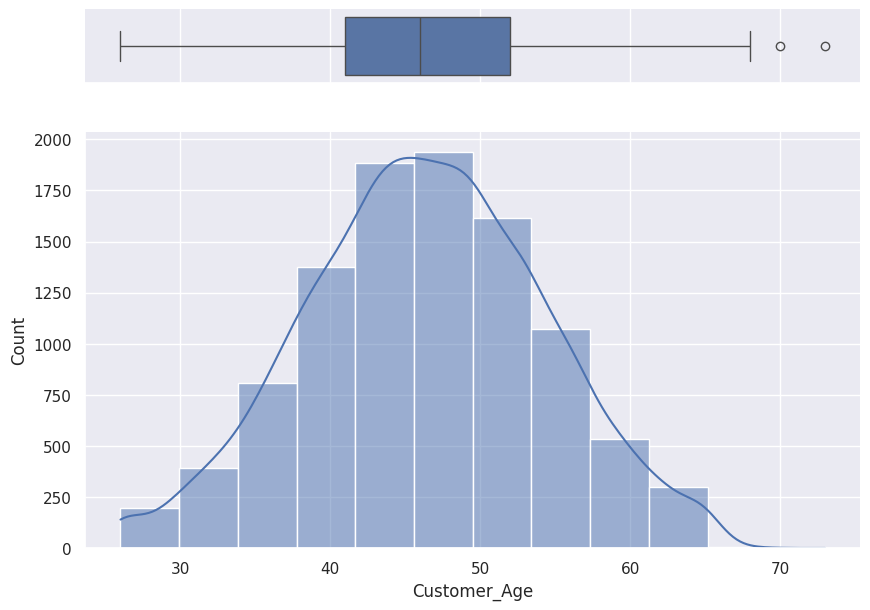

In [ ]:
import seaborn as sns
x = data['Customer_Age']

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=12, kde=True, stat='count', ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

The distribution of age is normal.
The boxplot shows that there are outliers at the right end.We will not treat these outliers as they represent the real market trend

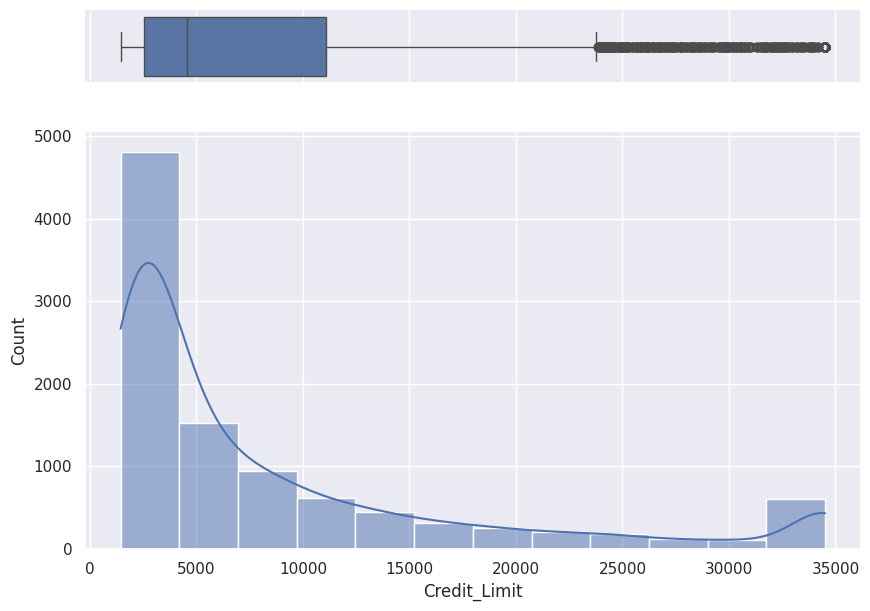

In [ ]:
import seaborn as sns
x = data['Credit_Limit']

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=12, kde=True, stat='count', ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

The distribution of the credit amount is right-skewed
The boxplot shows that there are outliers at the right end. We will not treat these outliers as they represent the real market trend

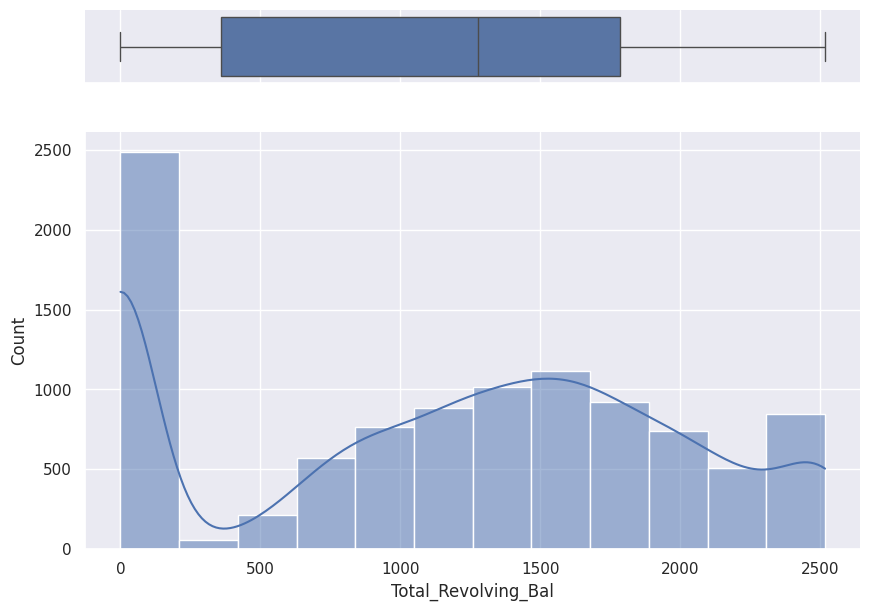

In [ ]:
import seaborn as sns
x = data['Total_Revolving_Bal']

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=12, kde=True, stat='count', ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

The distribution of the balance that carries over from one month to the next is the revolving balance for which the credit is given is somewhat normal.

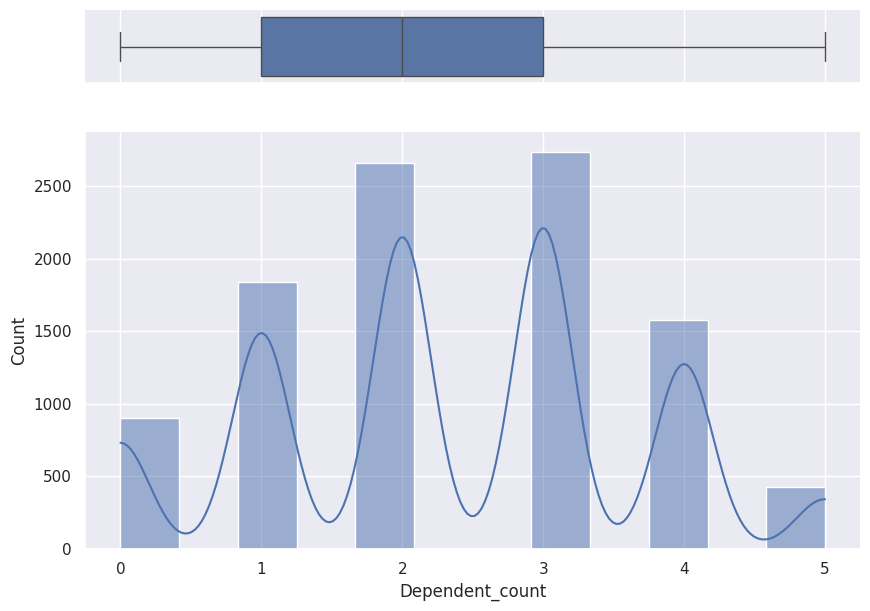

In [ ]:
import seaborn as sns
x = data['Dependent_count']

f, (ax_box, ax_hist) = plt.subplots(2, sharex=True, gridspec_kw={"height_ratios": (.15, .85)})

sns.boxplot(x=x, ax=ax_box)
sns.histplot(x=x, bins=12, kde=True, stat='count', ax=ax_hist)

ax_box.set(yticks=[])
sns.despine(ax=ax_hist)
sns.despine(ax=ax_box, left=True)

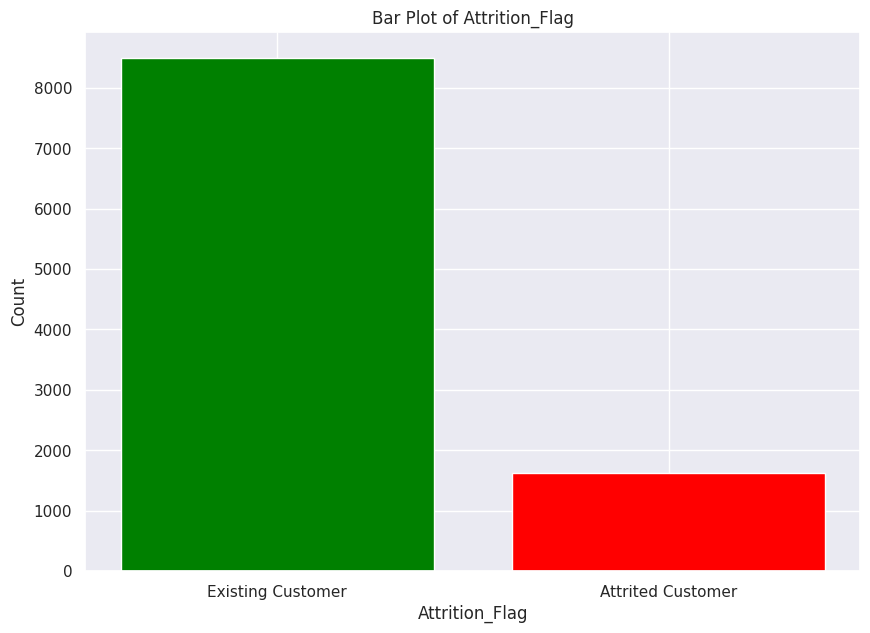

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

Attrition_Flag_counts = data['Attrition_Flag'].value_counts()

plt.bar(Attrition_Flag_counts.index, Attrition_Flag_counts, color=['green', 'red'])

# Add labels and title
plt.xlabel('Attrition_Flag')
plt.ylabel('Count')
plt.title('Bar Plot of Attrition_Flag')

plt.show()


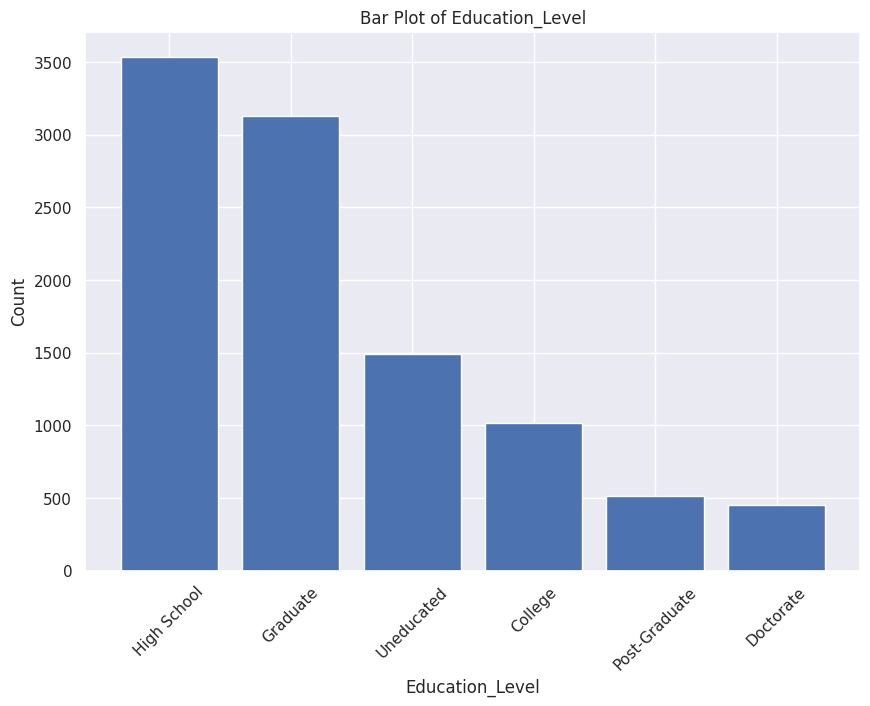

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd

Education_Level_counts = data['Education_Level'].value_counts()

plt.bar(Education_Level_counts.index, Education_Level_counts)

# Add labels and title
plt.xlabel('Education_Level')
plt.ylabel('Count')
plt.title('Bar Plot of Education_Level')

plt.xticks(rotation=45)

plt.show()

**Bivariate**

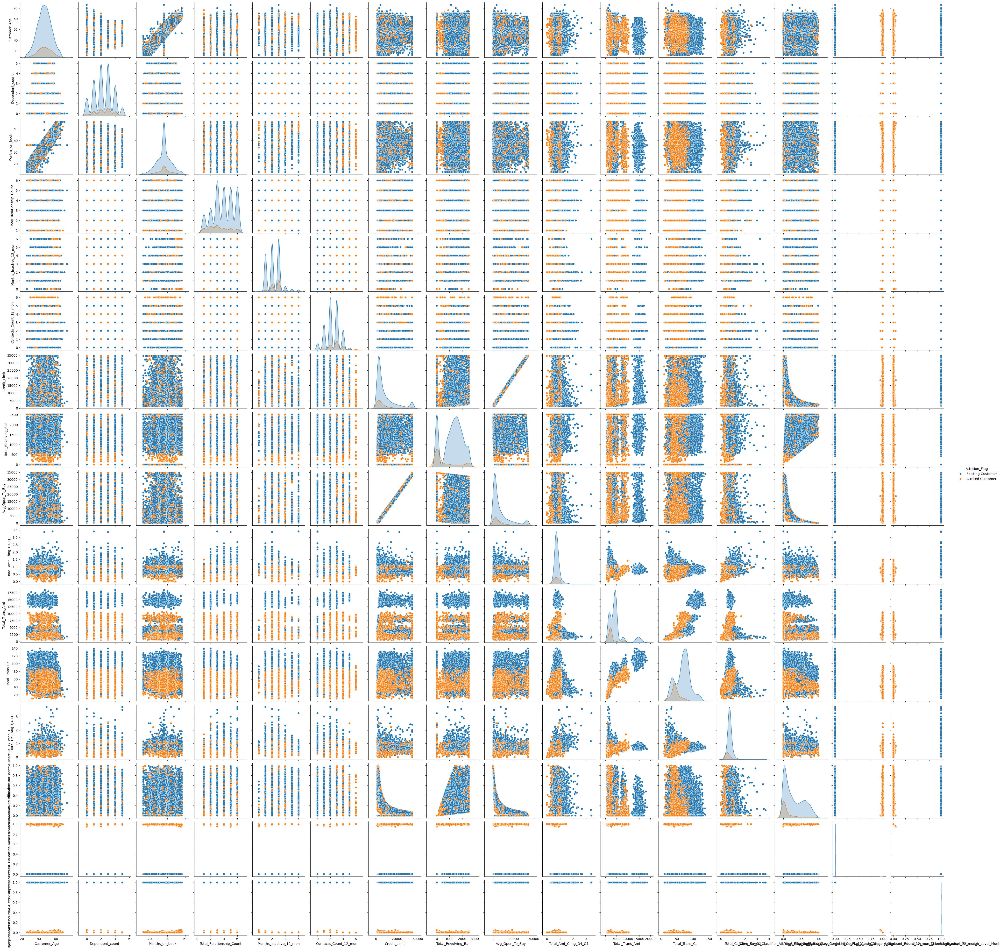

In [ ]:
# seaborn pairplot
sns.pairplot(data, hue="Attrition_Flag")


**Let's explore this further with the help of other plots.**

<Axes: xlabel='Attrition_Flag', ylabel='Customer_Age'>

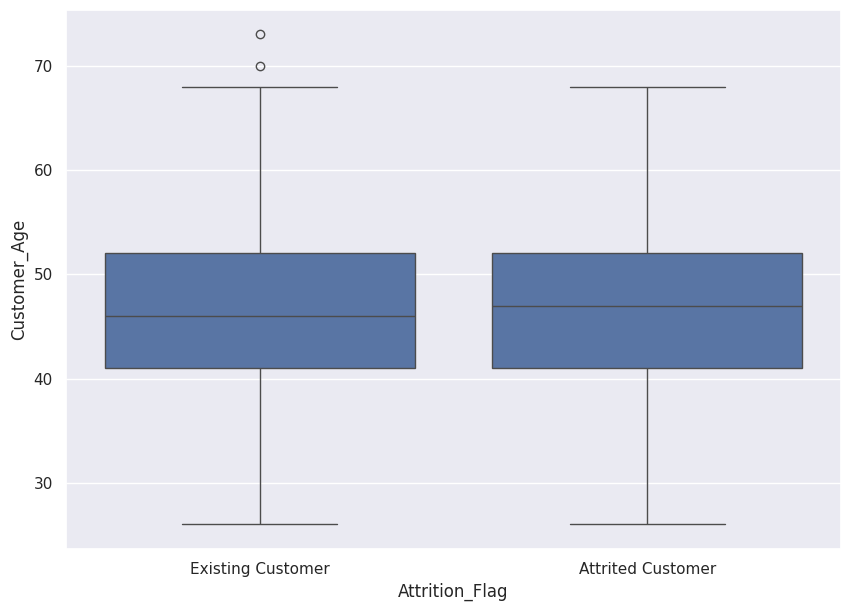

In [ ]:
# box plots on 2 variables
sns.set(rc={"figure.figsize": (10, 7)})
sns.boxplot(x="Attrition_Flag", y="Customer_Age", data=data, orient="vertical")

We can see that the median age of attritees is higher than the median age of non-attritees.
This shows that younger customers are more likely to stay as customers.
There are outliers in boxplots of only existing customers.

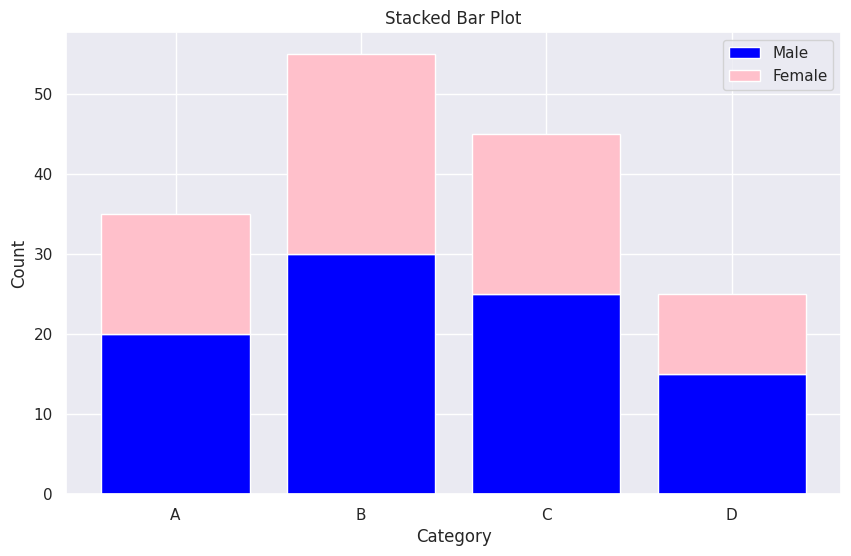

In [ ]:
# Stacked bar plot example
import matplotlib.pyplot as plt
import pandas as pd
data1 = {
    'Category': ['A', 'B', 'C', 'D'],
    'Male': [20, 30, 25, 15],
    'Female': [15, 25, 20, 10]
}
df = pd.DataFrame(data1)

plt.figure(figsize=(10, 6))

# Create a stacked bar plot
plt.bar(df['Category'], df['Male'], label='Male', color='blue')
plt.bar(df['Category'], df['Female'], bottom=df['Male'], label='Female', color='pink')

# Add labels and title
plt.xlabel('Category')
plt.ylabel('Count')
plt.title('Stacked Bar Plot')

# Add legend
plt.legend()

# Show the plot
plt.show()


In [ ]:
import seaborn as sns
data.head()

,Attrition_Flag,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,Existing Customer,45.0,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,Existing Customer,49.0,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,Existing Customer,51.0,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,Existing Customer,40.0,F,4,High School,Married,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,Existing Customer,40.0,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


<Axes: xlabel='Customer_Age', ylabel='Proportion'>

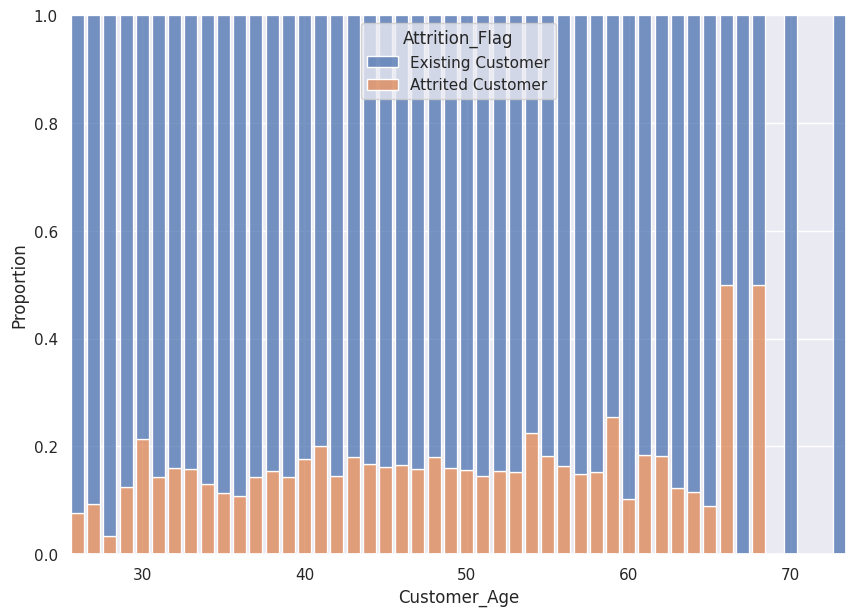

In [ ]:
sns.histplot(
    data=data,
    x='Customer_Age', hue="Attrition_Flag",
    multiple="fill", stat="proportion",
    discrete=True, shrink=.8)

We see how older customers(70+) tend to be existing customers while Younger people might look to attrite for new and better credit options.

40-year-olds take up the majority of the dataset.

43 - 48 year olds tended to attrite.

<Axes: xlabel='Card_Category', ylabel='Proportion'>

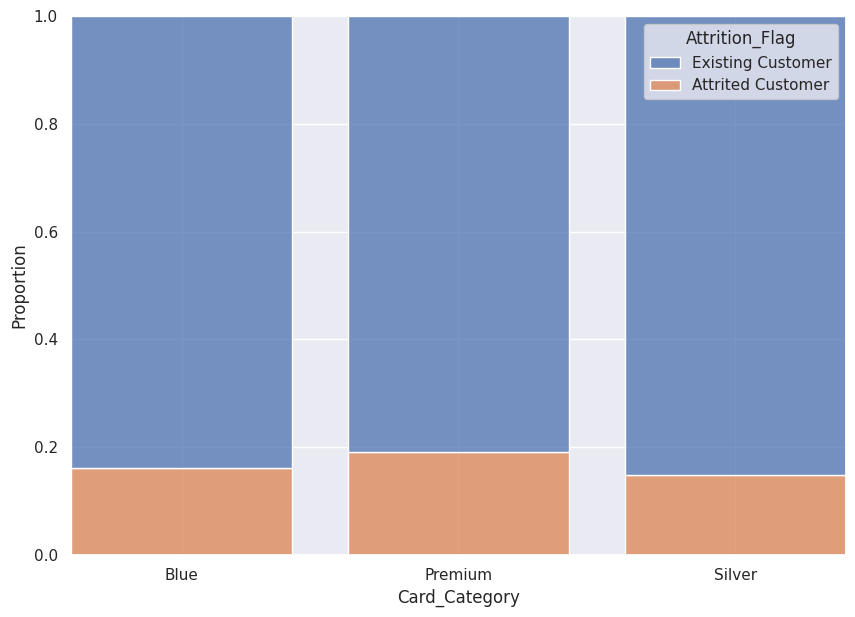

In [ ]:
sns.histplot(
    data=data,
    x='Card_Category', hue="Attrition_Flag",
    multiple="fill", stat="proportion",
    discrete=True, shrink=.8)

Customers owning a Silver or Blue card are less likely to attrit
Customers with Platinum or Gold cards are more likley to attrit.


<ipython-input-88-4106b8aba0c6>:3: FutureWarning: The default value of numeric_only in DataFrame.corr is deprecated. In a future version, it will default to False. Select only valid columns or specify the value of numeric_only to silence this warning.
  sns.heatmap(data.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")


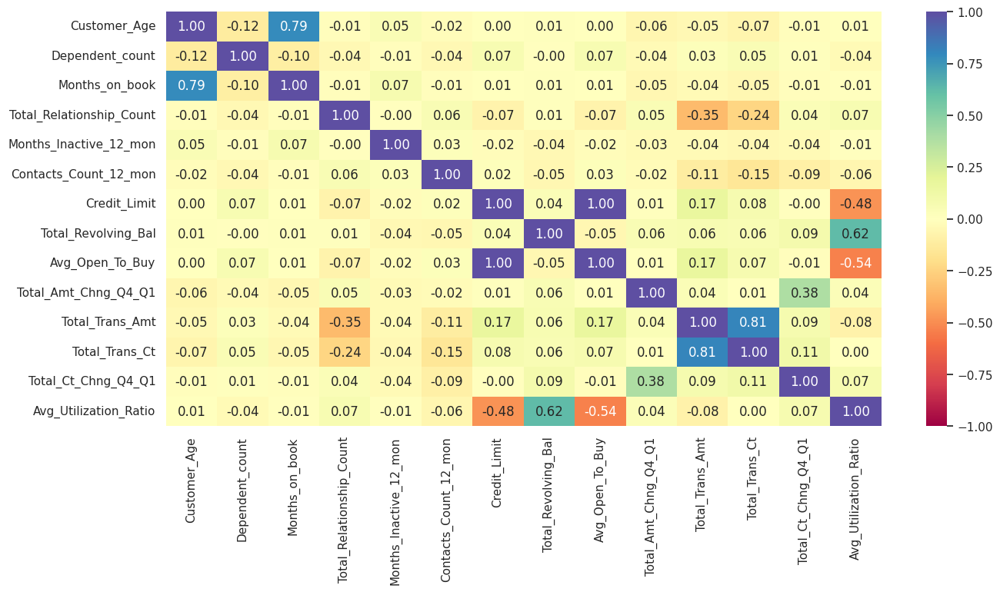

In [ ]:
# plot hitmap correlation matrix
plt.figure(figsize=(15, 7))
sns.heatmap(data.corr(), annot=True, vmin=-1, vmax=1, fmt=".2f", cmap="Spectral")
plt.show()

Total_Trans_Ct is highly correlated with Total_Trans_Amt which makes sense since both are related to the transactions of the credit card holder.
Months_on_book is related to Customer_Age which makes some sense since older customers would have more time on the banks books.
Avg_Utilization_Ratio has a correlation with Total_Revolving_Bal which makes sense since both are related to blaance.
Other variables have no significant correlation between them

# **Data preprocessing for Modeling**

In [ ]:
# Separating dep and indep variable
X = data.drop(columns="Attrition_Flag")
y = data["Attrition_Flag"]
X.head()

,Customer_Age,Gender,Dependent_count,Education_Level,Marital_Status,Income_Category,Card_Category,Months_on_book,Total_Relationship_Count,Months_Inactive_12_mon,Contacts_Count_12_mon,Credit_Limit,Total_Revolving_Bal,Avg_Open_To_Buy,Total_Amt_Chng_Q4_Q1,Total_Trans_Amt,Total_Trans_Ct,Total_Ct_Chng_Q4_Q1,Avg_Utilization_Ratio
0,45.0,M,3,High School,Married,$60K - $80K,Blue,39,5,1,3,12691.0,777,11914.0,1.335,1144,42,1.625,0.061
1,49.0,F,5,Graduate,Single,Less than $40K,Blue,44,6,1,2,8256.0,864,7392.0,1.541,1291,33,3.714,0.105
2,51.0,M,3,Graduate,Married,$80K - $120K,Blue,36,4,1,0,3418.0,0,3418.0,2.594,1887,20,2.333,0.000
3,40.0,F,4,High School,Married,Less than $40K,Blue,34,3,4,1,3313.0,2517,796.0,1.405,1171,20,2.333,0.760
4,40.0,M,3,Uneducated,Married,$60K - $80K,Blue,21,5,1,0,4716.0,0,4716.0,2.175,816,28,2.500,0.000


In [ ]:
y

0        Existing Customer
1        Existing Customer
2        Existing Customer
3        Existing Customer
4        Existing Customer
               ...        
10122    Existing Customer
10123    Attrited Customer
10124    Attrited Customer
10125    Attrited Customer
10126    Attrited Customer
Name: Attrition_Flag, Length: 10127, dtype: object

# **OneHotEncoding Categorical and Feature Scaling numeric data**

In [ ]:
#Encoding categorical col and feature scaling numeric cols
import pandas as pd
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
# Create transformers
feature_scaler = StandardScaler()
oneHot_encoder = OneHotEncoder()

# Create a ColumnTransformer
col_transformer = ColumnTransformer(
    transformers=[
        ('featureScaling', feature_scaler, X.select_dtypes(include=['number']).columns),
        ('OneHotEncoding', oneHot_encoder, X.select_dtypes(exclude=['number']).columns)
    ])

# Apply the ColumnTransformer to the DataFrame
X_processed = col_transformer.fit_transform(X)

In [ ]:
X_processed

array([[-0.16529438,  0.50336813,  0.38462088, ...,  1.        ,
         0.        ,  0.        ],
       [ 0.33384336,  2.04319867,  1.01071482, ...,  1.        ,
         0.        ,  0.        ],
       [ 0.58341222,  0.50336813,  0.00896451, ...,  1.        ,
         0.        ,  0.        ],
       ...,
       [-0.29007881, -1.03646242,  0.00896451, ...,  1.        ,
         0.        ,  0.        ],
       [-2.03706087, -0.26654715,  0.00896451, ...,  1.        ,
         0.        ,  0.        ],
       [-0.41486324, -0.26654715, -1.36844216, ...,  0.        ,
         0.        ,  1.        ]])

In [ ]:
y

array([1, 1, 1, ..., 0, 0, 0])

In [ ]:
# encoding Attrition_Flag attribute
from sklearn.preprocessing import LabelEncoder
encoder=LabelEncoder()
y=encoder.fit_transform(y)
y

array([1, 1, 1, ..., 0, 0, 0])

# **Splitting data into training, validation and test set:**

In [ ]:
# first we split data into 2 parts, say temporary and test
from sklearn.model_selection import train_test_split
X_temp, X_test, y_temp, y_test = train_test_split(X_processed, y, test_size=0.20, random_state=0, stratify=y)

# then we split the temporary set into train and validation
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp,test_size=0.25,random_state=1, stratify=y_temp)  # set the weighting feature on

print(X_train.shape, X_val.shape, X_test.shape)

(6075, 33) (2026, 33) (2026, 33)


In [ ]:
X_train

array([[-0.16529438,  1.2732834 , -0.24147306, ...,  1.        ,
         0.        ,  0.        ],
       [ 1.33211882,  0.50336813,  1.88724634, ...,  1.        ,
         0.        ,  0.        ],
       [-0.16529438, -0.26654715,  0.1341833 , ...,  1.        ,
         0.        ,  0.        ],
       ...,
       [-0.29007881,  1.2732834 ,  0.1341833 , ...,  1.        ,
         0.        ,  0.        ],
       [-1.03878541, -1.03646242, -1.36844216, ...,  1.        ,
         0.        ,  0.        ],
       [-1.03878541, -0.26654715,  0.00896451, ...,  1.        ,
         0.        ,  0.        ]])

In [ ]:
X_val

array([[-0.78921654, -0.26654715, -0.24147306, ...,  1.        ,
         0.        ,  0.        ],
       [ 0.70819666,  1.2732834 ,  1.13593361, ...,  1.        ,
         0.        ,  0.        ],
       [ 0.58341222,  0.50336813,  0.00896451, ...,  1.        ,
         0.        ,  0.        ],
       ...,
       [-0.16529438,  2.04319867, -1.36844216, ...,  1.        ,
         0.        ,  0.        ],
       [ 0.20905892, -1.03646242,  0.38462088, ...,  1.        ,
         0.        ,  0.        ],
       [-0.29007881,  1.2732834 ,  0.25940209, ...,  1.        ,
         0.        ,  0.        ]])

# **Creating the Mod**el
**Model evaluation criterion:**

Impact of Models that make wrong predictions :

1. Predicting a customers close their credit card account but the customer   
   doesn't - Loss of resources
2. Predicting a customer will not close their credit card account but the customer does - Loss of opportunity/business

**Which case is more important?**

Predicting a customer will not close their credit card account but the customer does i.e. losing on a potential existing customer because that customer will not be targeted by the business team when they should have targeted.

**How to reduce this loss i.e need to reduce False Negatives?**
( False Negatives==>case where the model predicts the negative class (0), indicating the event will not occur, but in reality, the true class is positive (1), and the event does occur.)
(Recall==>Recall, also known as Sensitivity or True Positive Rate, is a performance metric used in binary classification that measures the ability of a model to correctly identify all relevant instances from the total positive instances in the dataset. It is defined as the ratio of true positive predictions to the sum of true positives and false negatives.True Positives (TP): The number of instances where the model correctly predicts the positive class.
False Negatives (FN): The number of instances where the model incorrectly predicts the negative class )

==> Company wants Recall to be maximized, greater the Recall lesser the chances of false negatives.

**Let's start by building different models using KFold and cross_val_score and tune the best model using GridSearchCV and RandomizedSearchCV**

==>Stratified K-Folds cross-validation provides dataset indices to split data
  into train/validation sets. Split dataset into k consecutive folds (without
  shuffling by default) keeping the distribution of both classes in each fold the same as the target variable. Each fold is then used once as validation while the k - 1 remaining folds form the training set.

In [ ]:
from sklearn.model_selection import cross_val_score, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import GradientBoostingClassifier, AdaBoostClassifier, BaggingClassifier
from xgboost import XGBClassifier
from sklearn.metrics import recall_score

# List of models with names and class_weight if applicable
models = [
    ("LogisticRegression", LogisticRegression(random_state=1, class_weight={0: 15, 1: 85})),
    ("DecisionTree", DecisionTreeClassifier(random_state=1, class_weight={0: 15, 1: 85})),
    ("GBC", GradientBoostingClassifier(random_state=1)),
    ("Adaboost", AdaBoostClassifier(random_state=1)),
    ("Xgboost", XGBClassifier(random_state=1, eval_metric="logloss")),
    ("Bagging", BaggingClassifier(random_state=1)),
]

# Display header
print("\nCross-Validation Performance:\n")

results=[]
names = []
# Loop through models for cross-validation
for name, model in models:
    scoring = "recall"
    kfold = StratifiedKFold(n_splits=5, shuffle=True, random_state=1)
    cv_result = cross_val_score(model, X_train, y_train, scoring=scoring, cv=kfold)
    results.append(cv_result)
    names.append(name)
    print(f"{name}: {cv_result.mean() * 100}")


# Display header
print("\nValidation Performance:\n")

# Loop through models for validation performance
for name, model in models:
    model.fit(X_train, y_train)
    scores = recall_score(y_val, model.predict(X_val))
    print(f"{name}: {scores}")



Cross-Validation Performance:

LogisticRegression: 99.64702033904828
DecisionTree: 95.15595835979141
GBC: 98.82333698935903
Adaboost: 97.881929611884
Xgboost: 98.54882718543747
Bagging: 97.31326367642248

Validation Performance:

LogisticRegression: 0.9976470588235294
DecisionTree: 0.9405882352941176
GBC: 0.9852941176470589
Adaboost: 0.9729411764705882
Xgboost: 0.9852941176470589
Bagging: 0.9723529411764706


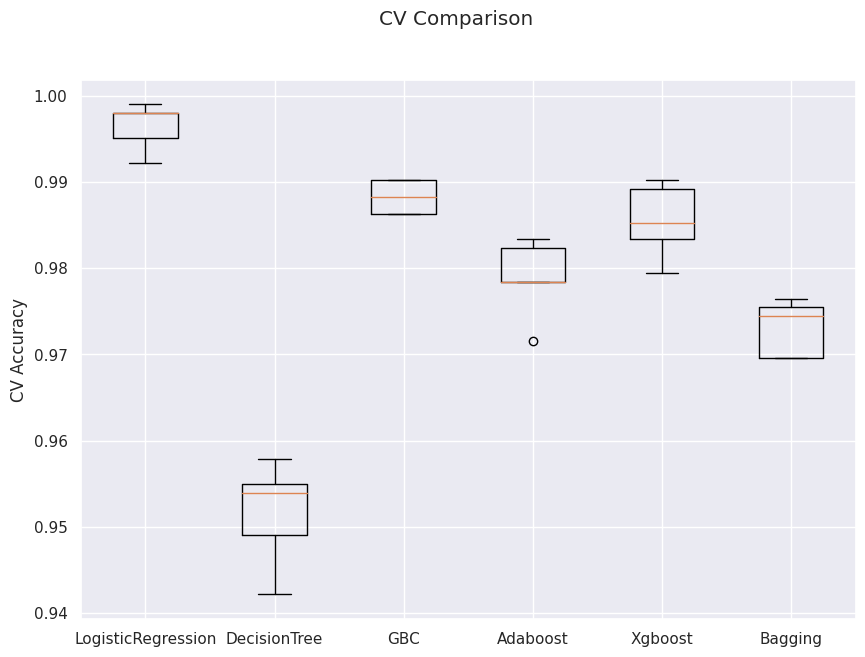

In [ ]:
# Plotting boxplots for CV scores of all models defined above
fig = plt.figure(figsize=(10, 7))

fig.suptitle("CV Comparison")
ax = fig.add_subplot(111)

plt.boxplot(results)
ax.set_xticklabels(names)
ax.set_ylabel('CV Accuracy')

plt.show()

 Logistic Regression is giving the highest cross-validated recall followed by GradientBoost Classifier.

We will tune - Adaboost, GradientBoost and XGBoost and see if the performance improves.

# **Hyperparameter Tuning**
We will tune Adaboost, GradientBoost and xgboost models using GridSearchCV and RandomizedSearchCV. We will also compare the performance and time taken by these two methods - grid search and randomized search.

First, let's create two functions to calculate different metrics and confusion matrix so that we don't have to use the same code repeatedly for each model.

In [ ]:
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score
import pandas as pd

def model_performance_classification_sklearn(model, predictors, target):
    """
    Function to compute different metrics to check classification model performance

    model: classifier
    predictors: independent variables
    target: dependent variable
    """

    # Predicting using the independent variables
    pred = model.predict(predictors)

    # Computing metrics
    acc = accuracy_score(target, pred)
    recall = recall_score(target, pred)
    precision = precision_score(target, pred)
    f1 = f1_score(target, pred)

    # Creating a DataFrame of metrics
    df_perf = pd.DataFrame(
        {"Accuracy": acc, "Recall": recall, "Precision": precision, "F1": f1},
        index=[0],
    )

    return df_perf


In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

def confusion_matrix_sklearn(model, predictors, target):
    """
    To plot the confusion_matrix with percentages

    model: classifier
    predictors: independent variables
    target: dependent variable
    """
    y_pred = model.predict(predictors)
    cm = confusion_matrix(target, y_pred, normalize='all')

    # Plot the matrix inside a heatmap
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt=".2%", cmap="Blues", cbar=False)

    # Set axis labels
    plt.ylabel("True label")
    plt.xlabel("Predicted label")

    # Display the percentages in the heatmap cells
    for i in range(2):
        for j in range(2):
            plt.text(j + 0.5, i + 0.5, f"{cm[i, j]:.2%}", ha='center', va='center')

    plt.show()

# Example usage:
# confusion_matrix_sklearn(your_model, X_test, y_test)


**Gradient Boost**

**GridSearchCV**

In [ ]:
%%time

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import GridSearchCV
from sklearn import metrics
import numpy as np

# defining model
model = GradientBoostingClassifier(random_state=1)

# Parameter grid to pass in GridSearchCV
param_grid = {
    "n_estimators": np.arange(10, 110, 10),
    "learning_rate": [0.1, 0.01, 0.2, 0.05, 1]
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling GridSearchCV
grid_cv = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scorer, cv=5, n_jobs=-1)

# Fitting parameters in GridSeachCV
grid_cv.fit(X_train, y_train)

print(
    "Best Parameters:{} \nScore: {}".format(grid_cv.best_params_, grid_cv.best_score_)
)




Best Parameters:{'learning_rate': 0.01, 'n_estimators': 10} 
Score: 1.0
CPU times: user 2.68 s, sys: 432 ms, total: 3.11 s
Wall time: 3min 16s


In [ ]:
# extract best estimator from the model
gbgscv = grid_cv.best_estimator_
# fit the model
gbgscv.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.01, n_estimators=10, random_state=1)

In [ ]:
# Calculating different metrics on train set
print("Training performance:")
gradient_grid_train = model_performance_classification_sklearn(gbgscv, X_train, y_train)
display(gradient_grid_train)

Training performance:


,Accuracy,Recall,Precision,F1
0,0.839342,1.0,0.839342,0.912654


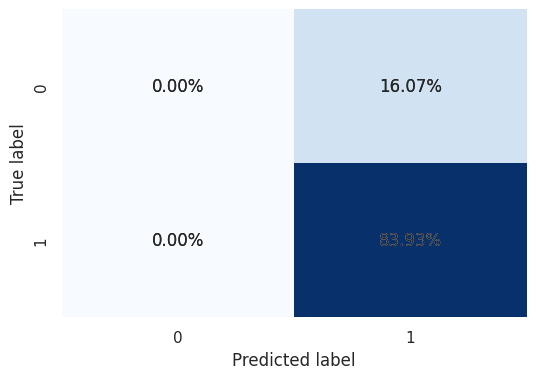

In [ ]:
# creating confusion matrix
confusion_matrix_sklearn(gbgscv, X_train, y_train)

In [ ]:
# Calculating different metrics on validation set
print("Validation performance:")
gradient_grid_val = model_performance_classification_sklearn(gbgscv, X_val, y_val)
display(gradient_grid_val)

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.839092,1.0,0.839092,0.912507


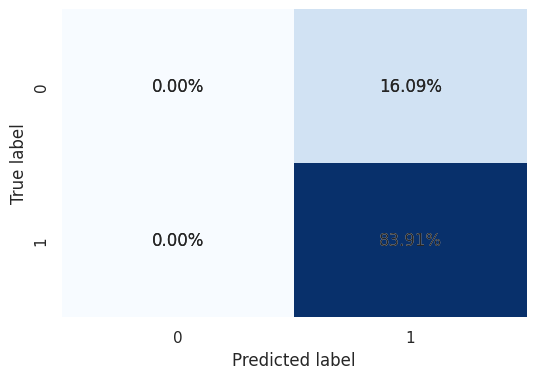

In [ ]:
# creating confusion matrix
confusion_matrix_sklearn(gbgscv, X_val, y_val)

**RandomizedSearchCV**

In [ ]:
%%time

from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV
from sklearn import metrics
import numpy as np

# Defining model
model = GradientBoostingClassifier(random_state=1)

# Parameter grid to pass in RandomizedSearchCV
param_grid = {
    "n_estimators": np.arange(10, 110, 10),
    "learning_rate": [0.1, 0.01, 0.2, 0.05, 1]
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_jobs=-1, n_iter=50, scoring=scorer, cv=3, random_state=1)

# Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train, y_train)

print("Best parameters are {} with CV score={}".format(randomized_cv.best_params_, randomized_cv.best_score_))


Best parameters are {'n_estimators': 10, 'learning_rate': 0.01} with CV score=1.0
CPU times: user 1.65 s, sys: 231 ms, total: 1.88 s
Wall time: 1min 40s


In [ ]:
# extract best estimator from the model
gbrs = randomized_cv.best_estimator_
# Fit the model on training data
gbrs.fit(X_train, y_train)

GradientBoostingClassifier(learning_rate=0.01, n_estimators=10, random_state=1)

In [ ]:
# Calculating different metrics on train set
print("Training performance:")
gradient_random_train = model_performance_classification_sklearn(gbrs, X_train, y_train)
display(gradient_random_train)

Training performance:


,Accuracy,Recall,Precision,F1
0,0.839342,1.0,0.839342,0.912654


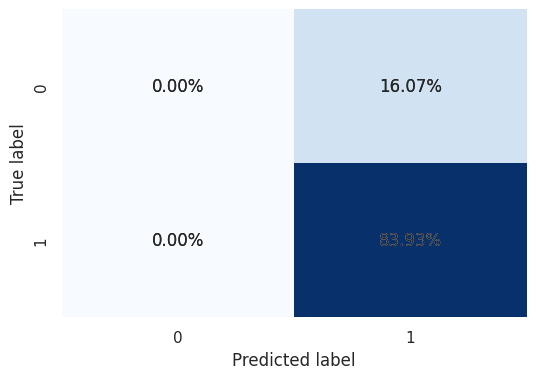

In [ ]:
# creating confusion matrix
confusion_matrix_sklearn(gbrs, X_train, y_train)

In [ ]:
# Calculating different metrics on validation set
print("Validation performance:")
gradient_random_val = model_performance_classification_sklearn(gbrs, X_val, y_val)
display(gradient_random_val)

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.839092,1.0,0.839092,0.912507


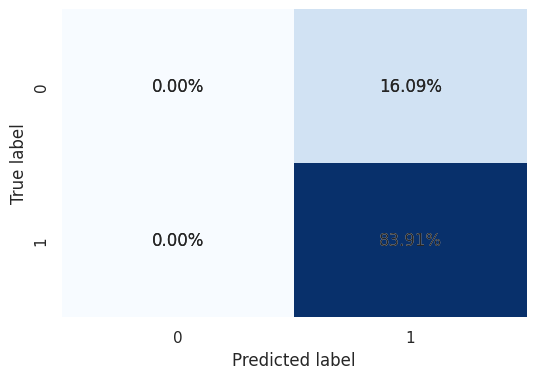

In [ ]:
# creating confusion matrix
confusion_matrix_sklearn(gbrs, X_val, y_val)

# **Adaboost**

**GridSearchCV**

In [ ]:
%%time

# defining model
model = AdaBoostClassifier(random_state=1)

# Parameter grid to pass in GridSearchCV
param_grid = {
    "n_estimators": np.arange(10, 110, 10),
    "learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=1, random_state=1),
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

# Calling GridSearchCV
grid_cv = GridSearchCV(estimator=model, param_grid=param_grid, scoring=scorer, cv=3, n_jobs = -1)

# Fitting parameters in GridSeachCV
grid_cv.fit(X_train, y_train)

print(
    "Best Parameters:{} \nScore: {}".format(grid_cv.best_params_, grid_cv.best_score_)
)

Best Parameters:{'base_estimator': DecisionTreeClassifier(max_depth=1, random_state=1), 'learning_rate': 0.1, 'n_estimators': 10} 
Score: 1.0
CPU times: user 3.91 s, sys: 593 ms, total: 4.5 s
Wall time: 5min 2s


/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


In [ ]:
# get best model
adb_tuned1 = grid_cv.best_estimator_
# fit the model
adb_tuned1.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1,
                                                         random_state=1),
                   learning_rate=0.1, n_estimators=10, random_state=1)

In [ ]:
# Calculating different metrics on train set
Adaboost_grid_train = model_performance_classification_sklearn(
    adb_tuned1, X_train, y_train
)
print("Training performance:")
Adaboost_grid_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.839342,1.0,0.839342,0.912654


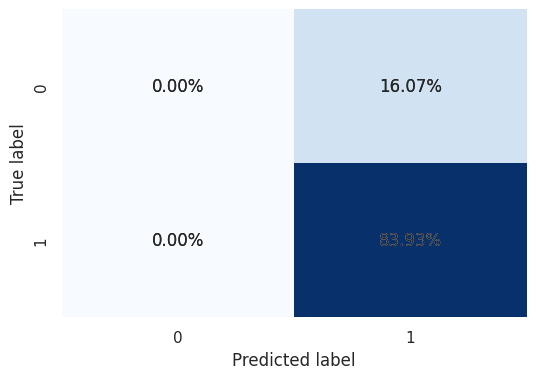

In [ ]:
# creating confusion matrix
confusion_matrix_sklearn(adb_tuned1, X_train, y_train)

In [ ]:
# Calculating different metrics on validation set
Adaboost_grid_val = model_performance_classification_sklearn(adb_tuned1, X_val, y_val)
print("Validation performance:")
Adaboost_grid_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.839092,1.0,0.839092,0.912507


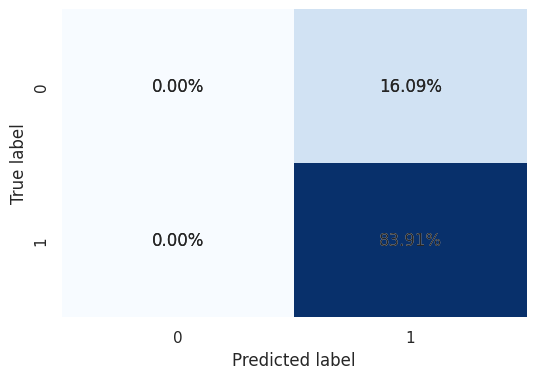

In [ ]:
# creating confusion matrix
confusion_matrix_sklearn(adb_tuned1, X_val, y_val)

**RandomizedSearchCV**

In [ ]:
%%time

# defining model
model = AdaBoostClassifier(random_state=1)

# Parameter grid to pass in GridSearchCV
param_grid = {
    "n_estimators": np.arange(10, 110, 10),
    "learning_rate": [0.1, 0.01, 0.2, 0.05, 1],
    "base_estimator": [
        DecisionTreeClassifier(max_depth=1, random_state=1),
        DecisionTreeClassifier(max_depth=2, random_state=1),
        DecisionTreeClassifier(max_depth=3, random_state=1),
    ],
}

# Type of scoring used to compare parameter combinations
scorer = metrics.make_scorer(metrics.recall_score)

#Calling RandomizedSearchCV
randomized_cv = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_jobs = -1, n_iter=50, scoring=scorer, cv=3, random_state=1)

#Fitting parameters in RandomizedSearchCV
randomized_cv.fit(X_train,y_train)

print("Best parameters are {} with CV score={}:" .format(randomized_cv.best_params_,randomized_cv.best_score_))

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


Best parameters are {'n_estimators': 50, 'learning_rate': 0.01, 'base_estimator': DecisionTreeClassifier(max_depth=1, random_state=1)} with CV score=1.0:
CPU times: user 1.68 s, sys: 180 ms, total: 1.86 s
Wall time: 1min 29s


In [ ]:
# building model with best parameters
adb_tuned2 = randomized_cv.best_estimator_
# Fit the model on training data
adb_tuned2.fit(X_train, y_train)

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_base.py:166: FutureWarning: `base_estimator` was renamed to `estimator` in version 1.2 and will be removed in 1.4.
  warnings.warn(


AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=1,
                                                         random_state=1),
                   learning_rate=0.01, random_state=1)

In [ ]:
# Calculating different metrics on train set
Adaboost_random_train = model_performance_classification_sklearn(
    adb_tuned2, X_train, y_train
)
print("Training performance:")
Adaboost_random_train

Training performance:


,Accuracy,Recall,Precision,F1
0,0.839342,1.0,0.839342,0.912654


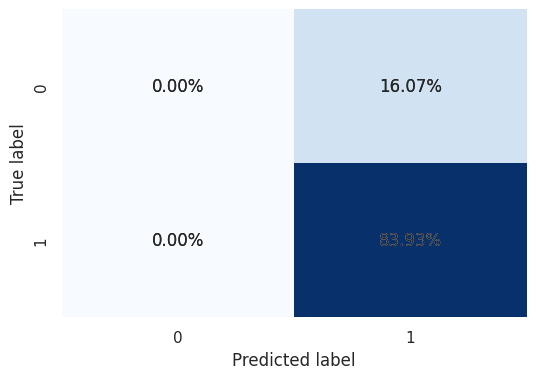

In [ ]:
# creating confusion matrix
confusion_matrix_sklearn(adb_tuned2, X_train, y_train)

In [ ]:
# Calculating different metrics on validation set
Adaboost_random_val = model_performance_classification_sklearn(adb_tuned2, X_val, y_val)
print("Validation performance:")
Adaboost_random_val

Validation performance:


,Accuracy,Recall,Precision,F1
0,0.839092,1.0,0.839092,0.912507


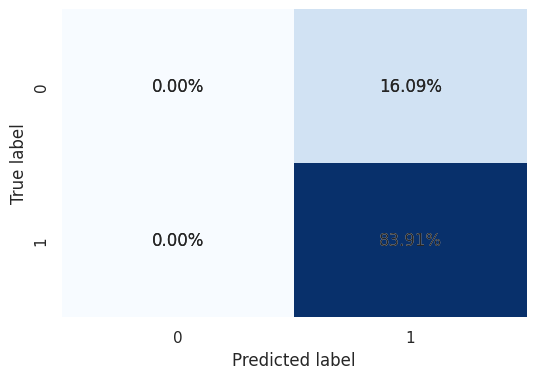

In [ ]:
# creating confusion matrix
confusion_matrix_sklearn(adb_tuned2, X_val, y_val)

# **Oversampling with Tuned Models**
Building the best modeling using oversampled data on the train and validation set

**Training Set**


In [ ]:
from imblearn.over_sampling import SMOTE

# print counts of target variable before oversampling
print("Before UpSampling, counts of label '1': {}".format(sum(y_train == 1)))
print("Before UpSampling, counts of label '0': {} \n".format(sum(y_train == 0)))

# Synthetic Minority Over Sampling Technique
sm = SMOTE(sampling_strategy=1, k_neighbors=5, random_state=1)

# fit and resample the training data
X_train_over, y_train_over = sm.fit_resample(X_train, y_train.ravel())

# prit data size after the oversampling
print("After UpSampling, counts of label '1': {}".format(sum(y_train_over == 1)))
print("After UpSampling, counts of label '0': {} \n".format(sum(y_train_over == 0)))


print("After UpSampling, the shape of train_X: {}".format(X_train_over.shape))
print("After UpSampling, the shape of train_y: {} \n".format(y_train_over.shape))

Before UpSampling, counts of label '1': 5099
Before UpSampling, counts of label '0': 976 

After UpSampling, counts of label '1': 5099
After UpSampling, counts of label '0': 5099 

After UpSampling, the shape of train_X: (10198, 33)
After UpSampling, the shape of train_y: (10198,) 

